In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import numpy as np
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F

from sklearn import preprocessing


# Remove all the warnings
import warnings
warnings.filterwarnings('ignore')

# Set env CUDA_LAUNCH_BLOCKING=1
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Retina display
%config InlineBackend.figure_format = 'retina'

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

In [2]:
if os.path.exists('/home/ayaz/Desktop/ML_ASS/dog.jpg'):
    print('dog.jpg exists')
else:
    !wget https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg -O dog.jpg

dog.jpg exists


In [3]:
# Read in a image from torchvision
img = torchvision.io.read_image("/home/ayaz/Desktop/ML_ASS/dog.jpg")
print(img.shape)

torch.Size([3, 1365, 2048])


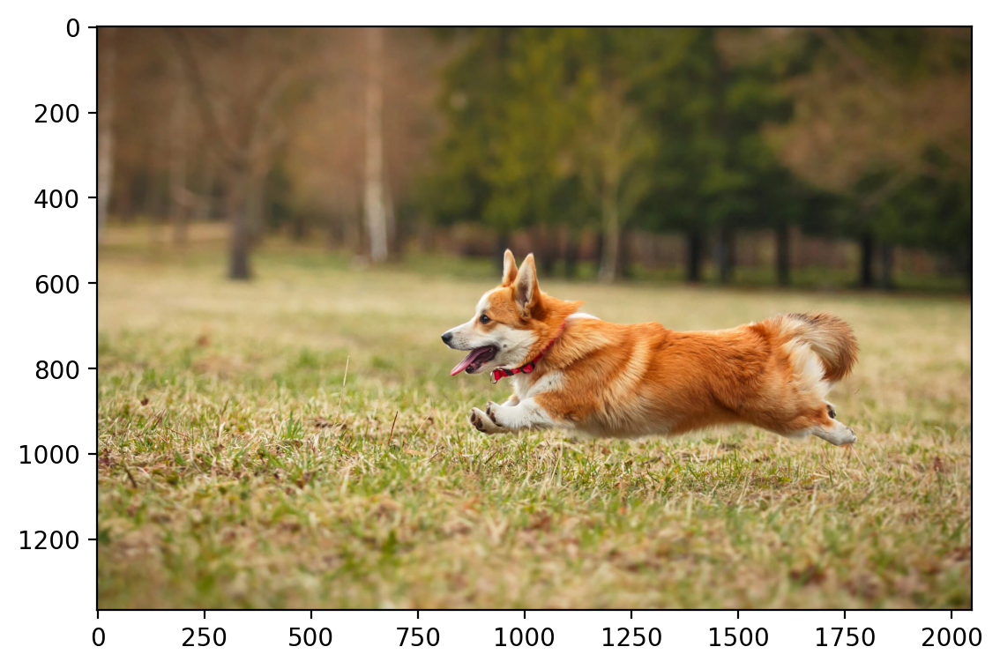

In [4]:
plt.imshow(rearrange(img, 'c h w -> h w c').numpy())


In [5]:
scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
scaler_img

MinMaxScaler()

In [6]:
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled.shape

img_scaled = torch.tensor(img_scaled)

In [7]:
crop = torchvision.transforms.functional.crop(img_scaled.cpu(), 600, 800, 400, 400)
crop.shape

torch.Size([3, 400, 400])

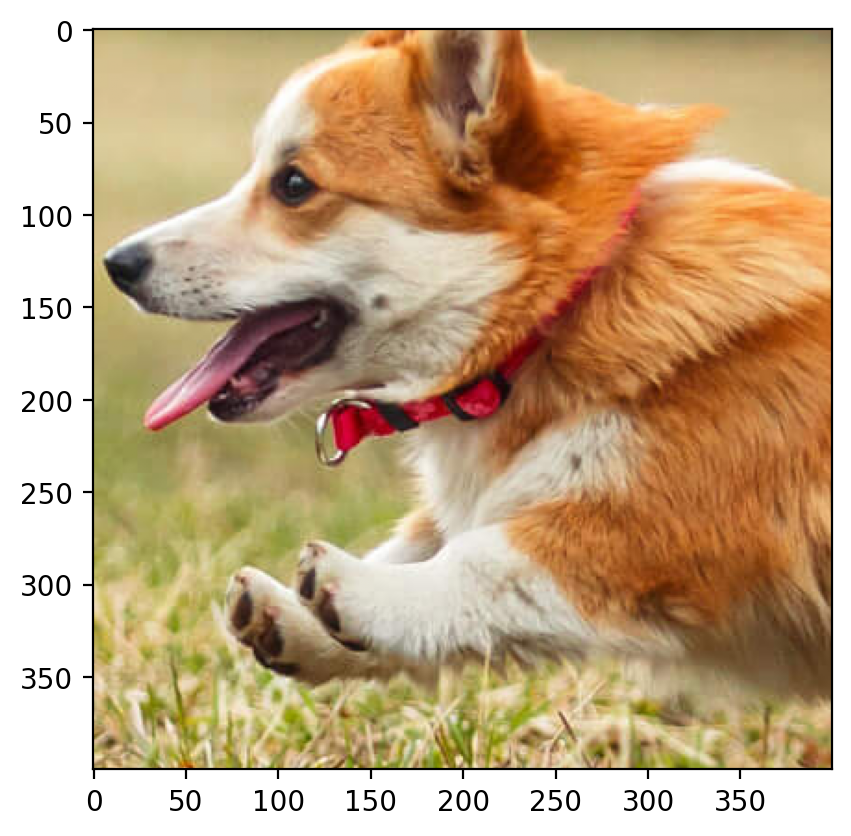

In [8]:
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())


In [9]:
class LinearModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features, out_features)
        
    def forward(self, x):
        return self.linear(x)

        

def train(net, lr, X, Y, epochs, verbose=True):
    """
    net: torch.nn.Module
    lr: float
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """

    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)
    for epoch in range(epochs):
        optimizer.zero_grad()
        outputs = net(X)
        
        
        loss = criterion(outputs, Y)
        loss.backward()
        optimizer.step()
        if verbose and epoch % 100 == 0:
            print(f"Epoch {epoch} loss: {loss.item():.6f}")
    return loss.item()
    

In [10]:
# Initialize indices and create the output tensor
resized_image  = crop[:, ::2, ::2].clone()

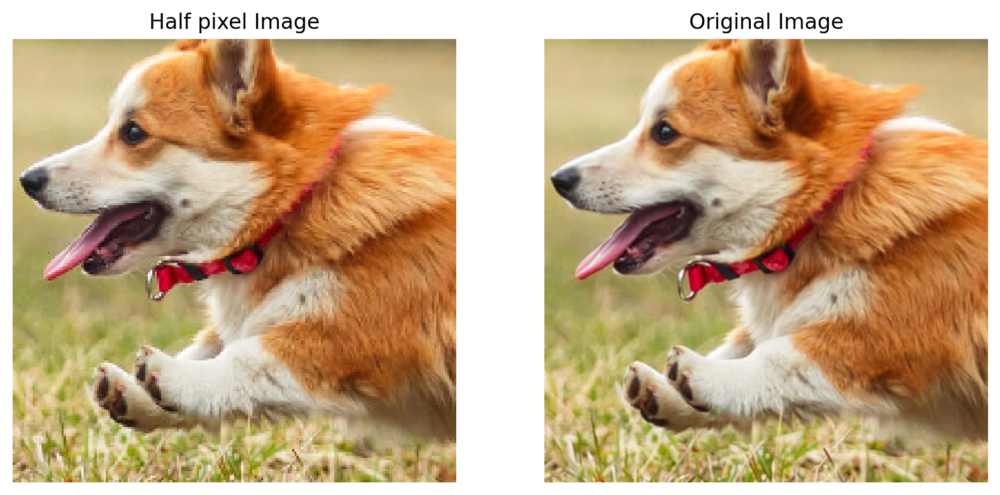

In [11]:
# Plot the original and resized images in separate subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Plot the resized image in the first subplot
axs[0].imshow(rearrange(resized_image, 'c h w -> h w c').cpu().numpy())
axs[0].set_title('Half pixel Image')
axs[0].axis('off')

# Plot the original image in the second subplot
axs[1].imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())
axs[1].set_title('Original Image')
axs[1].axis('off')

# Show the plot
plt.show()

In [12]:
scaledUP_image = torch.zeros(3, 400, 400)
scaledUP_image_ref = torch.zeros(3, 400, 400) # This is for referrence

print(scaledUP_image.shape)

# Loop through the empty tensor and fill it with values from the resized_image tensor alternatively
for i in range(400):
    for j in range(400):
        if i % 2 == 0 and j % 2 == 0:
            scaledUP_image[:, i, j] = resized_image[:, i // 2, j // 2]
            scaledUP_image_ref[:, i, j] = resized_image[:, i // 2, j // 2]

torch.Size([3, 400, 400])


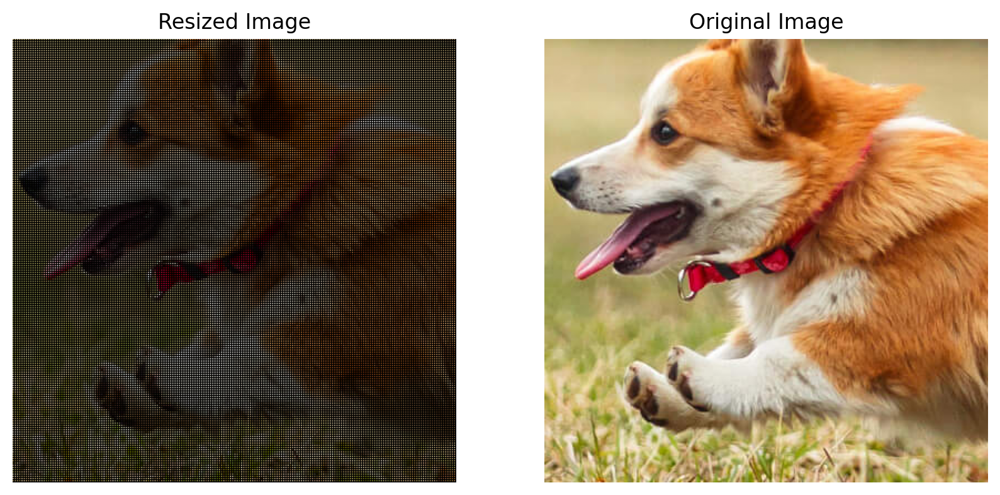

In [13]:
# Plot the original and resized images in separate subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Plot the resized image in the first subplot
axs[0].imshow(rearrange(scaledUP_image, 'c h w -> h w c').cpu().numpy())
axs[0].set_title('Resized Image')
axs[0].axis('off')

# Plot the original image in the second subplot
axs[1].imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())
axs[1].set_title('Original Image')
axs[1].axis('off')

# Show the plot
plt.show()

In [14]:

# Create a 2D grid of (x,y) coordinates (h, w)
# width values change faster than height values
w_coords = torch.arange(400).repeat(400, 1)
h_coords = torch.arange(400).repeat(400, 1).t()
w_coords = w_coords.reshape(-1)
h_coords = h_coords.reshape(-1)

# Combine the x and y coordinates into a single tensor
dog_X = torch.stack([h_coords, w_coords], dim=1).float()


# Reshape the image to (h * w, num_channels)
dog_Y = rearrange(scaledUP_image, 'c h w -> (h w) c').float()
dog_Y = dog_Y.to(device)

dog_X.shape, dog_Y.shape

(torch.Size([160000, 2]), torch.Size([160000, 3]))

In [15]:
# MinMaxScaler from -1 to 1
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_X.cpu())

# Scale the X coordinates
dog_X_scaled = scaler_X.transform(dog_X.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaled = torch.tensor(dog_X_scaled)

# Set to dtype float32
dog_X_scaled = dog_X_scaled.float()

In [16]:
# create RFF features
def create_rff_features(X, num_features, sigma):
    from sklearn.kernel_approximation import RBFSampler
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2))
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype=torch.float32)


In [17]:
X_rff = create_rff_features(dog_X_scaled, 5500, 0.008)
print(X_rff.shape)

torch.Size([160000, 5500])


In [18]:
X_rff = torch.reshape(X_rff, (400, 400, 5500))
dog_Y  =  torch.reshape(dog_Y, (400, 400, 3))
print(X_rff.shape)
print(dog_Y.shape)


torch.Size([400, 400, 5500])
torch.Size([400, 400, 3])


In [19]:
X_rff_train = torch.zeros(200,200, 5500)
dog_Y_train = torch.zeros(200,200,3)
print(X_rff_train.shape)
print(dog_Y_train.shape)

torch.Size([200, 200, 5500])
torch.Size([200, 200, 3])


In [20]:
for i in range(0, 400, 2):  # Iterate every alternate row
    for j in range(0, 400, 2):  # Iterate every alternate column
        # Copy the elements of every alternate row and column to X_rff_train
        X_rff_train[i//2, j//2, :] = X_rff[i, j, :]
        dog_Y_train[i//2, j//2, :] = dog_Y[i, j, :]

In [21]:
X_rff=X_rff.reshape(400*400, 5500)
X_rff_train=X_rff_train.reshape(200*200, 5500)
dog_Y=dog_Y.reshape(400*400,3)
dog_Y_train=dog_Y_train.reshape(200*200,3)

In [22]:
print(X_rff.shape, dog_Y.shape)
print(X_rff_train.shape, dog_Y_train.shape)

torch.Size([160000, 5500]) torch.Size([160000, 3])
torch.Size([40000, 5500]) torch.Size([40000, 3])


In [23]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff_train.to(device), dog_Y_train.to(device), 2500)

Epoch 0 loss: 0.374219
Epoch 100 loss: 0.065626
Epoch 200 loss: 0.028059
Epoch 300 loss: 0.024568
Epoch 400 loss: 0.023502
Epoch 500 loss: 0.022830
Epoch 600 loss: 0.022375
Epoch 700 loss: 0.022066
Epoch 800 loss: 0.021856
Epoch 900 loss: 0.021714
Epoch 1000 loss: 0.021617
Epoch 1100 loss: 0.021550
Epoch 1200 loss: 0.021504
Epoch 1300 loss: 0.021470
Epoch 1400 loss: 0.021446
Epoch 1500 loss: 0.021426
Epoch 1600 loss: 0.021411
Epoch 1700 loss: 0.021397
Epoch 1800 loss: 0.021385
Epoch 1900 loss: 0.021374
Epoch 2000 loss: 0.021364
Epoch 2100 loss: 0.021355
Epoch 2200 loss: 0.021346
Epoch 2300 loss: 0.021337
Epoch 2400 loss: 0.021329


0.021321024745702744

In [24]:
# To avoide memory cunsumption
X_rff_train=X_rff_train.cpu()
dog_Y_train=dog_Y_train.cpu()

In [18]:
def extra_pixels(net, X, title=""):
    """
    net: torch.nn.Module
    X: Input feature
    Y: Label
    """
    num_channels, height, width = 3, 400, 400
    net.eval()
    with torch.no_grad():
        outputs = net(X)
        outputs = outputs.reshape(height, width, num_channels)
        outputs = outputs.permute(0,1,2)
    return outputs

In [33]:
new_pixels= extra_pixels(net, X_rff.to(device), title="Scaled up Image")


In [35]:
print(new_pixels.shape)
print(scaledUP_image.shape)


torch.Size([400, 400, 3])
torch.Size([3, 400, 400])


In [37]:
scaledUP_image= scaledUP_image.permute(2,0,1)
print(scaledUP_image.shape)

torch.Size([400, 400, 3])


In [38]:
# Replace the black pixels with generated pixels
for i in range(400):
    for j in range(400):
        if (i+j) != 0:
            scaledUP_image[i][j]= new_pixels[i][j]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


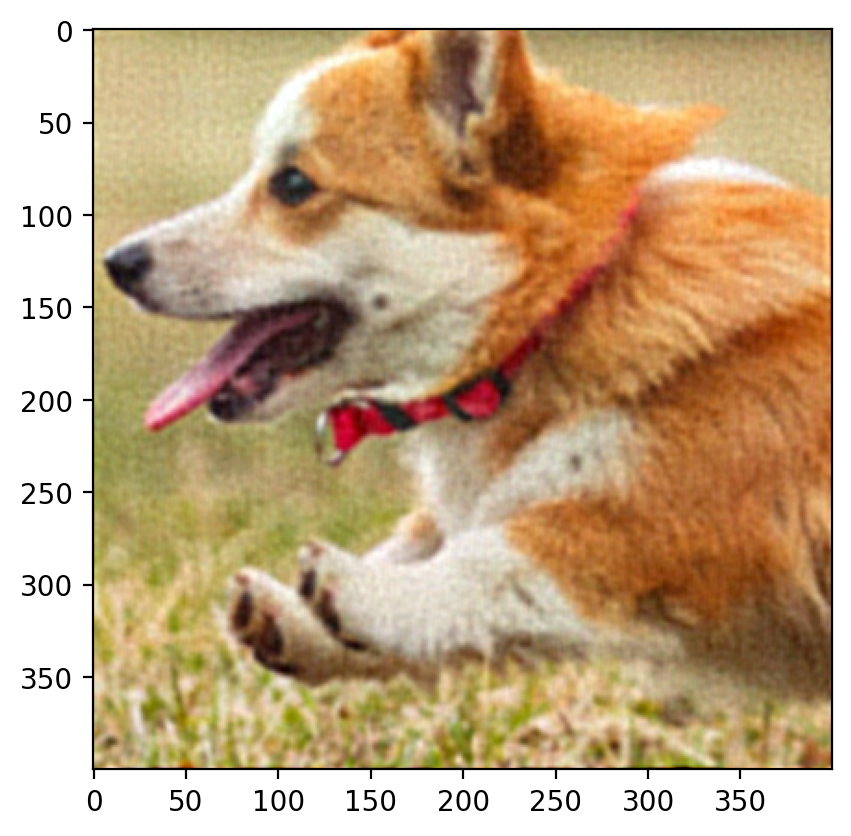

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


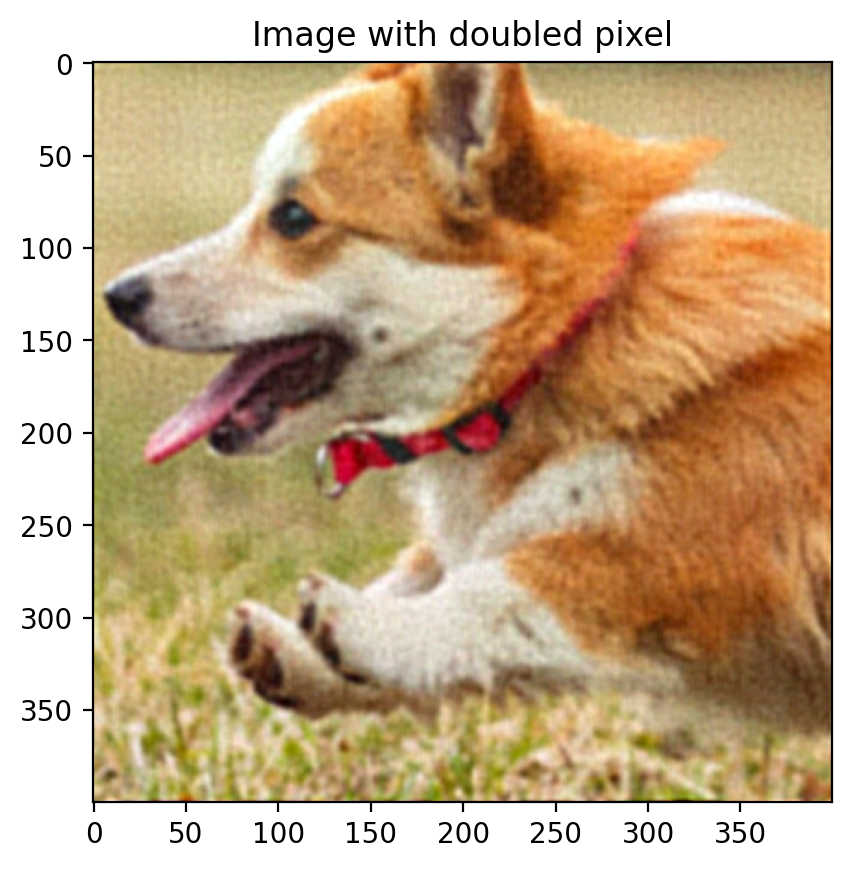

In [41]:
plt.imshow(new_pixels.cpu().numpy())
plt.show()

plt.imshow(scaledUP_image.cpu().numpy())
plt.title('Image with doubled pixel')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


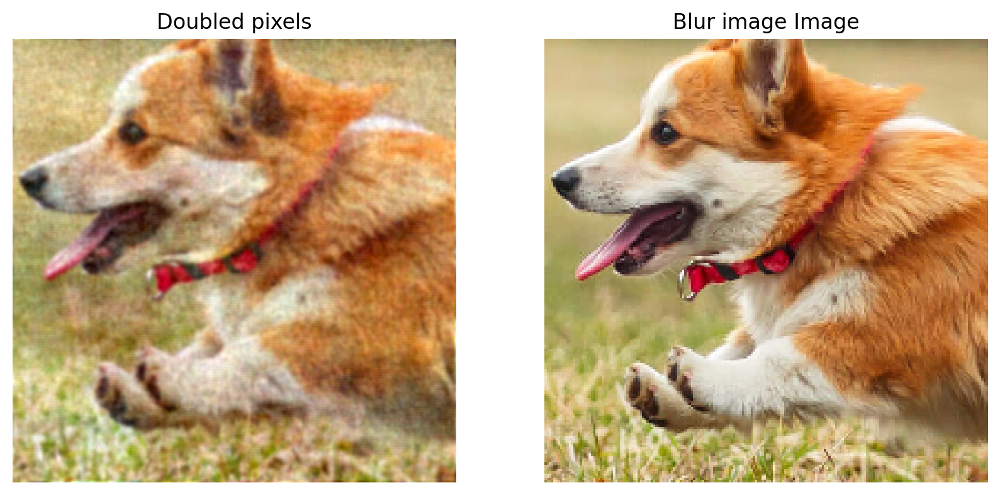

In [43]:
# Plot the original and resized images in separate subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Plot the resized image in the first subplot
axs[0].imshow(scaledUP_image.cpu().numpy())
axs[0].set_title('Doubled pixels')
axs[0].axis('off')

# Plot the original image in the second subplot
axs[1].imshow(rearrange(resized_image, 'c h w -> h w c').cpu().numpy())
axs[1].set_title('Blur image Image')
axs[1].axis('off')

# Show the plot
plt.show()

$$ Calculating\ RMSE\ and\ PSNR$$

In [36]:
scaledUP_image_ref= scaledUP_image_ref.permute(2,0,1)

assert scaledUP_image.shape == scaledUP_image_ref.shape, "Images must have the same dimensions"

# squared differences between corresponding pixels
squared_diff = (scaledUP_image- scaledUP_image_ref) ** 2

# mean of squared differences
mean_squared_diff = torch.mean(squared_diff)

# square root of mean squared differences to get RMSE
rmse = torch.sqrt(mean_squared_diff)

print("RMSE:", rmse)


RMSE: tensor(0.5238)


In [37]:
max_pixel_value=255

# Ensure both images have the same shape
assert scaledUP_image.shape == scaledUP_image_ref.shape, "Images must have the same dimensions"

#  mean squared error (MSE)
mse = torch.mean((scaledUP_image - scaledUP_image_ref) ** 2)

# PSNR using the formula
psnr = 10 * torch.log10((max_pixel_value ** 2) / mse)


print("PSNR:", psnr)


PSNR: tensor(53.7480)


$$ Question\ 5$$

Remove 30x30 block

In [136]:
removed_block_img=crop.clone()

# Randomly select the top-left corner of the 30x30 block
start_row = np.random.randint(0, 36)  # Choose any random row index between 0 and 370 (400 - 30)
start_col = np.random.randint(0, 360)  # Choose any random column index between 0 and 370 (400 - 30)

# Store the positions of removed pixels
removed_positions = []

# Remove the 30x30 block from the image and store the positions of removed pixels
end_row = start_row + 30
end_col = start_col + 30


for i in range(start_row, end_row):
    for j in range(start_col, end_col):
        removed_positions.append([i, j])
        removed_block_img[:,i,j] = 0  # Set the pixel value to 0

# Convert the list of removed pixel positions to a NumPy array
removed_positions = np.array(removed_positions)[::-1]
print(removed_block_img.shape)

removed_block_image_ref= removed_block_img.clone()

torch.Size([3, 400, 400])


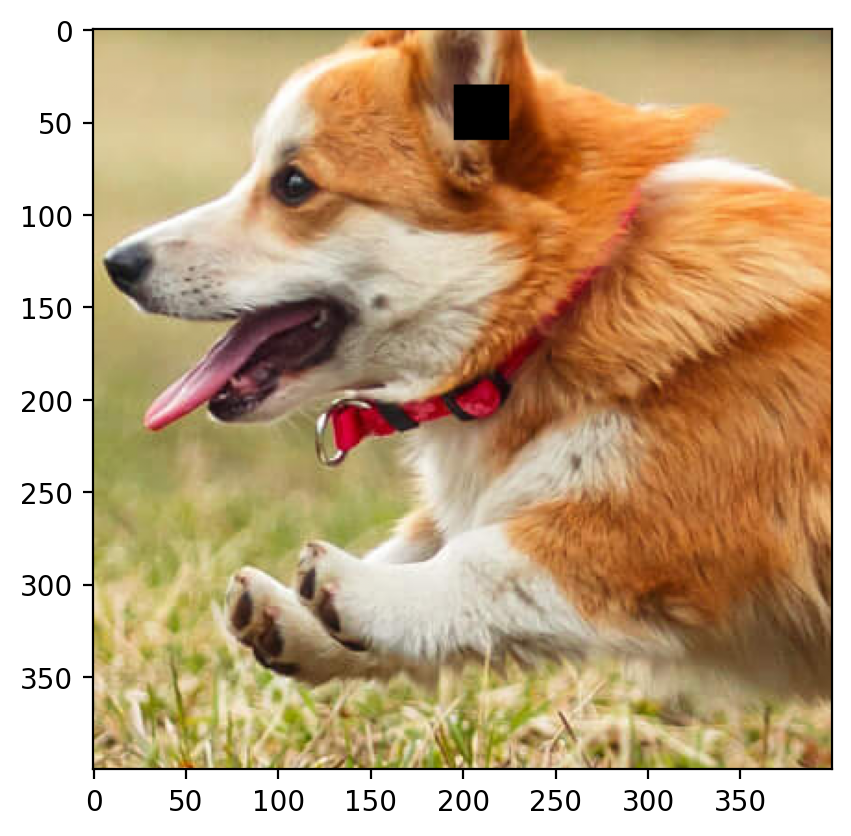

In [137]:
plt.imshow(rearrange(removed_block_img, 'c h w -> h w c').cpu().numpy())


In [138]:
# Saperate training data
X_rff = torch.reshape(X_rff, (400, 400, 5500))
dog_Y  =  torch.reshape(dog_Y, (400, 400, 3))
print(X_rff.shape)
print(dog_Y.shape)
print(" ")

X_rff_train = torch.zeros((400-30)*(400-30), 5500)
dog_Y_train = torch.zeros((400-30)*(400-30),3)
print(X_rff_train.shape)
print(dog_Y_train.shape)

torch.Size([400, 400, 5500])
torch.Size([400, 400, 3])
 
torch.Size([136900, 5500])
torch.Size([136900, 3])


In [139]:
dog_Y=dog_Y.cpu()

In [140]:
# Create a boolean mask to identify the pixels that are not in removed_positions
mask = np.ones((400, 400), dtype=bool)
mask[removed_positions[:, 0], removed_positions[:, 1]] = False

# Use boolean indexing to select the pixels that are not removed
dog_Y_train = removed_block_img[:, mask].permute(1,0)
X_rff_train = X_rff[mask,:]

# Make sure of datatype
X_rff_train= X_rff_train.to(torch.float32)
dog_Y_train= dog_Y_train.to(torch.float32)


In [141]:
print(X_rff_train.shape)

torch.Size([159100, 5500])


In [129]:
net = LinearModel(X_rff_train.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff_train.to(device), dog_Y_train.to(device), 2500)

Epoch 0 loss: 0.367786
Epoch 100 loss: 0.060270
Epoch 200 loss: 0.023588
Epoch 300 loss: 0.020007
Epoch 400 loss: 0.018865
Epoch 500 loss: 0.018194
Epoch 600 loss: 0.017757
Epoch 700 loss: 0.017454
Epoch 800 loss: 0.017231
Epoch 900 loss: 0.017059
Epoch 1000 loss: 0.016921
Epoch 1100 loss: 0.016807
Epoch 1200 loss: 0.016710
Epoch 1300 loss: 0.016626
Epoch 1400 loss: 0.016553
Epoch 1500 loss: 0.016487
Epoch 1600 loss: 0.016427
Epoch 1700 loss: 0.016372
Epoch 1800 loss: 0.016321
Epoch 1900 loss: 0.016273
Epoch 2000 loss: 0.016228
Epoch 2100 loss: 0.016185
Epoch 2200 loss: 0.016144
Epoch 2300 loss: 0.016105
Epoch 2400 loss: 0.016068


0.016032006591558456

In [142]:
new_pixels= extra_pixels(net, X_rff.to(device), title="Scaled up Image").permute(2,1,0)
new_pixels=new_pixels.permute(0,2,1)

In [143]:
print(new_pixels.shape)

torch.Size([3, 400, 400])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


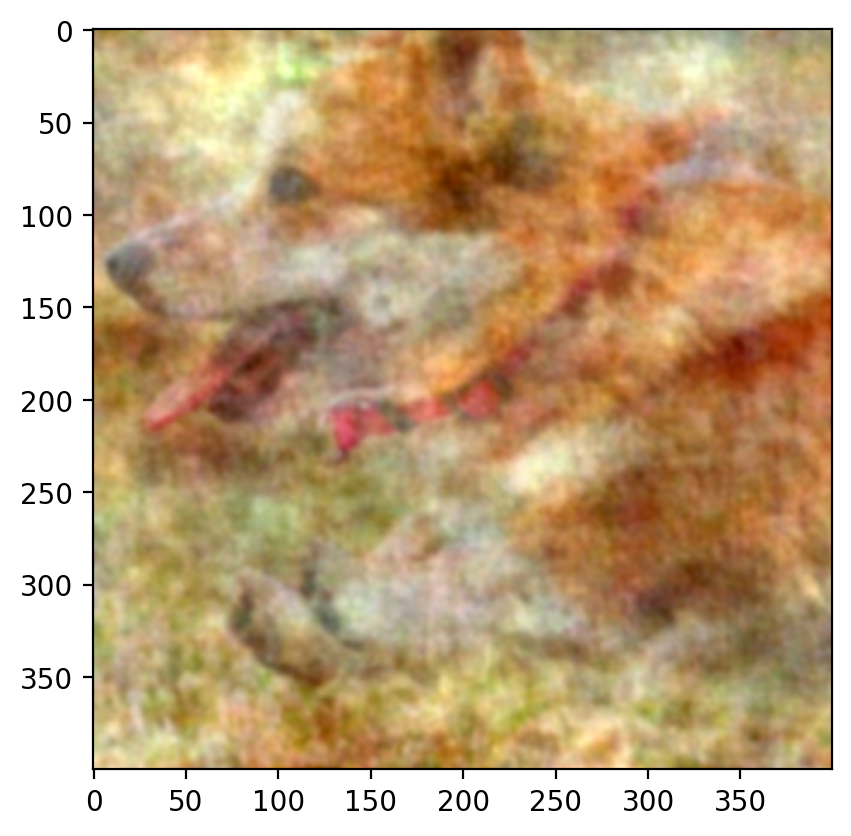

In [144]:
plt.imshow(rearrange(new_pixels, 'c h w -> h w c').cpu().numpy())


In [145]:
def replace_info(generated_image,old_image, positions):
    """ Takes Genrated image and image with information lose and fill the emplt pixels from generated pixels"""
    for i in positions[:,0]:
        for j in positions[:,1]:
            old_image[:,i,j]=generated_image[:,i,j]


In [146]:
replace_info(new_pixels,removed_block_img,removed_positions)

Text(0.5, 1.0, 'Image with filled block')

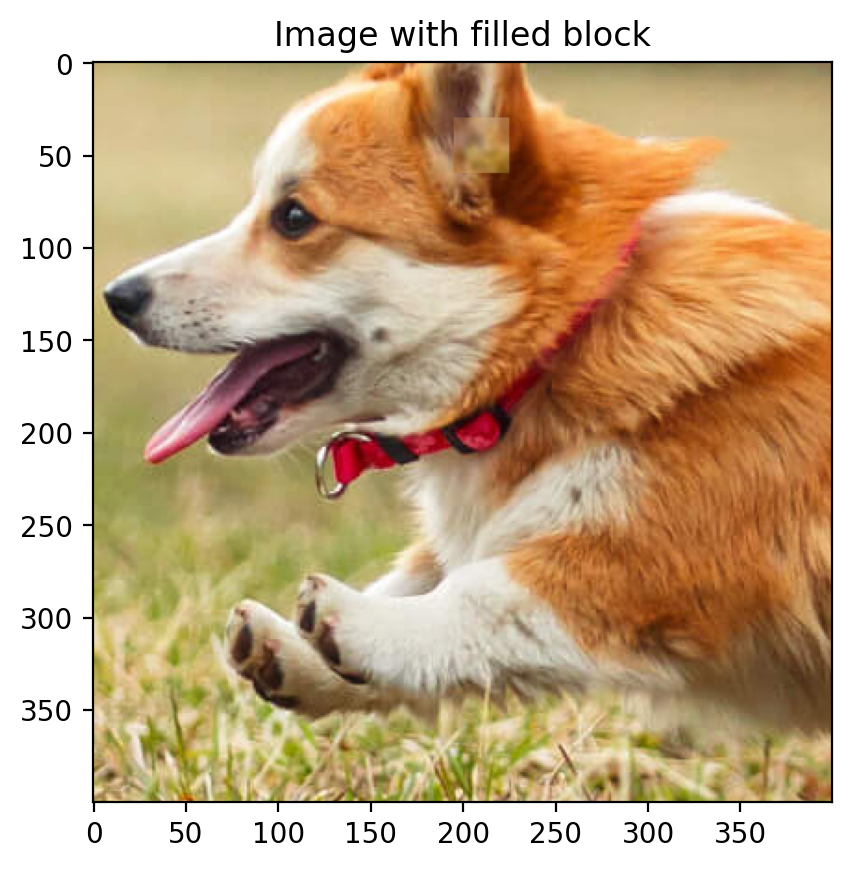

In [147]:
plt.imshow(rearrange(removed_block_img, 'c h w -> h w c').cpu().numpy())
plt.title("Image with filled block")


Part b

In [160]:
# number of pixels to remove

rand_remove= crop.clone()

num_pixels_to_remove = 900
img_height, img_width = rand_remove.shape[1:]

# Generate random pixel positions to remove
random_positions = np.random.randint(0, img_height, size=(num_pixels_to_remove, 2))


removed_positions = []

# Remove the pixels from the image and store their positions
for pos in random_positions:
    i, j = pos
    removed_positions.append([i, j])
    rand_remove[:, i, j] = 0  # Set the pixel value to 0

# Convert the list of removed pixel positions 
removed_positions = np.array(removed_positions)[::-1]
rend_remove_ref= rand_remove.clone()

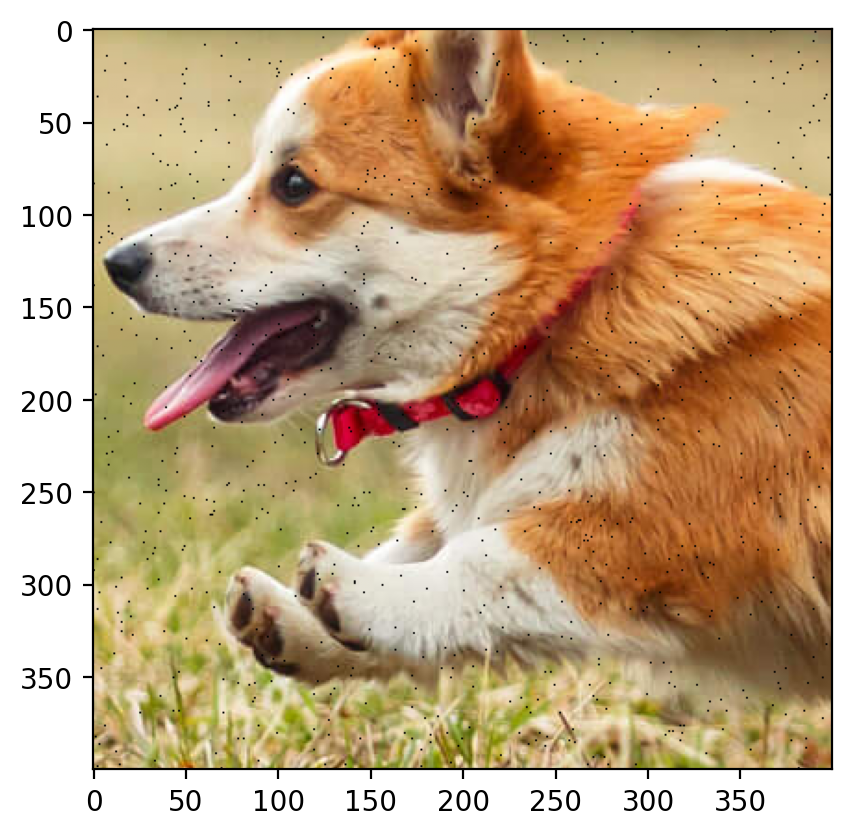

In [149]:
plt.imshow(rearrange(rand_remove, 'c h w -> h w c').cpu().numpy())


In [150]:
X_rff = torch.reshape(X_rff, (400, 400, 5500))
dog_Y  =  torch.reshape(dog_Y, (400, 400, 3))
print(X_rff.shape)
print(dog_Y.shape)

torch.Size([400, 400, 5500])
torch.Size([400, 400, 3])


In [151]:
X_rff_train = torch.zeros((400-30)*(400-30), 5500)
dog_Y_train = torch.zeros((400-30)*(400-30),3)
print(X_rff_train.shape)
print(dog_Y_train.shape)

torch.Size([136900, 5500])
torch.Size([136900, 3])


In [152]:
dog_Y=dog_Y.cpu()

In [153]:
# Create a boolean mask to identify the pixels that are not in removed_positions
mask = np.ones((400, 400), dtype=bool)
mask[random_positions[:, 0], random_positions[:, 1]] = False

# Use boolean indexing to select the pixels that are not removed
dog_Y_train = rand_remove[:, mask].permute(1,0)
X_rff_train = X_rff[mask,:]

# Make sure of datatype
X_rff_train= X_rff_train.to(torch.float32)
dog_Y_train= dog_Y_train.to(torch.float32)


In [89]:
net = LinearModel(X_rff_train.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff_train.to(device), dog_Y_train.to(device), 2500)

Epoch 0 loss: 0.359146
Epoch 100 loss: 0.058921
Epoch 200 loss: 0.023636
Epoch 300 loss: 0.020061
Epoch 400 loss: 0.018897
Epoch 500 loss: 0.018211
Epoch 600 loss: 0.017767
Epoch 700 loss: 0.017461
Epoch 800 loss: 0.017237
Epoch 900 loss: 0.017064
Epoch 1000 loss: 0.016926
Epoch 1100 loss: 0.016811
Epoch 1200 loss: 0.016713
Epoch 1300 loss: 0.016628
Epoch 1400 loss: 0.016553
Epoch 1500 loss: 0.016486
Epoch 1600 loss: 0.016425
Epoch 1700 loss: 0.016369
Epoch 1800 loss: 0.016317
Epoch 1900 loss: 0.016267
Epoch 2000 loss: 0.016221
Epoch 2100 loss: 0.016176
Epoch 2200 loss: 0.016134
Epoch 2300 loss: 0.016094
Epoch 2400 loss: 0.016055


0.016018567606806755

In [161]:
new_pixels= extra_pixels(net, X_rff.to(device), title="Scaled up Image").permute(2,1,0)
new_pixels=new_pixels.permute(0,2,1)
print(new_pixels.shape)

torch.Size([3, 400, 400])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


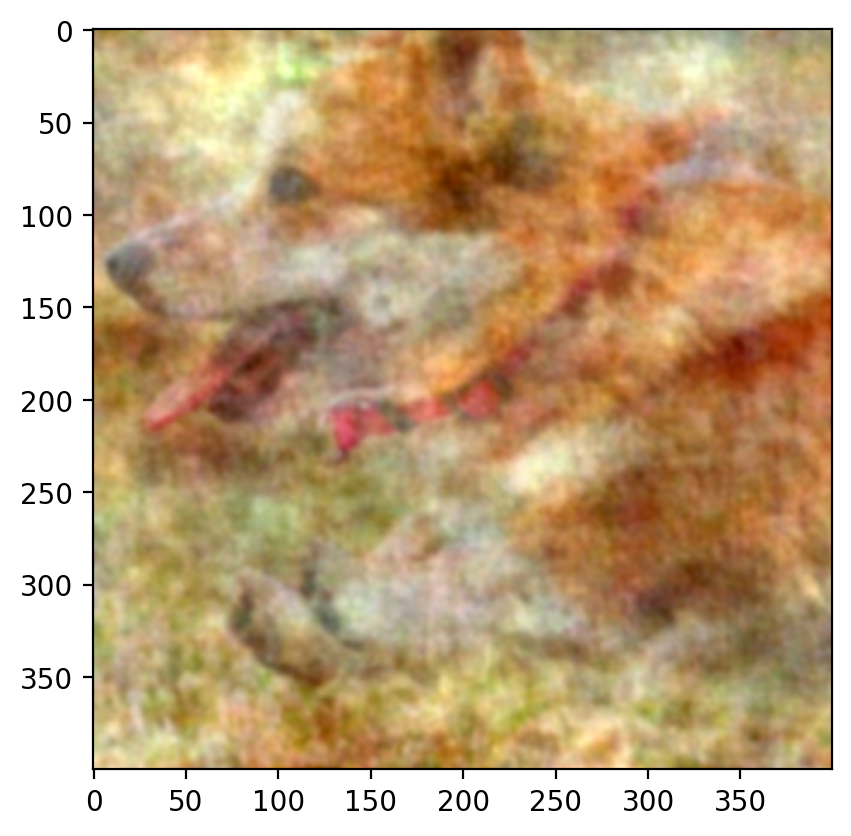

In [162]:
plt.imshow(rearrange(new_pixels, 'c h w -> h w c').cpu().numpy())


In [163]:
print(rand_remove.shape)

torch.Size([3, 400, 400])


In [164]:
print(new_pixels.shape)

torch.Size([3, 400, 400])


In [165]:
replace_info(new_pixels,rand_remove,random_positions)

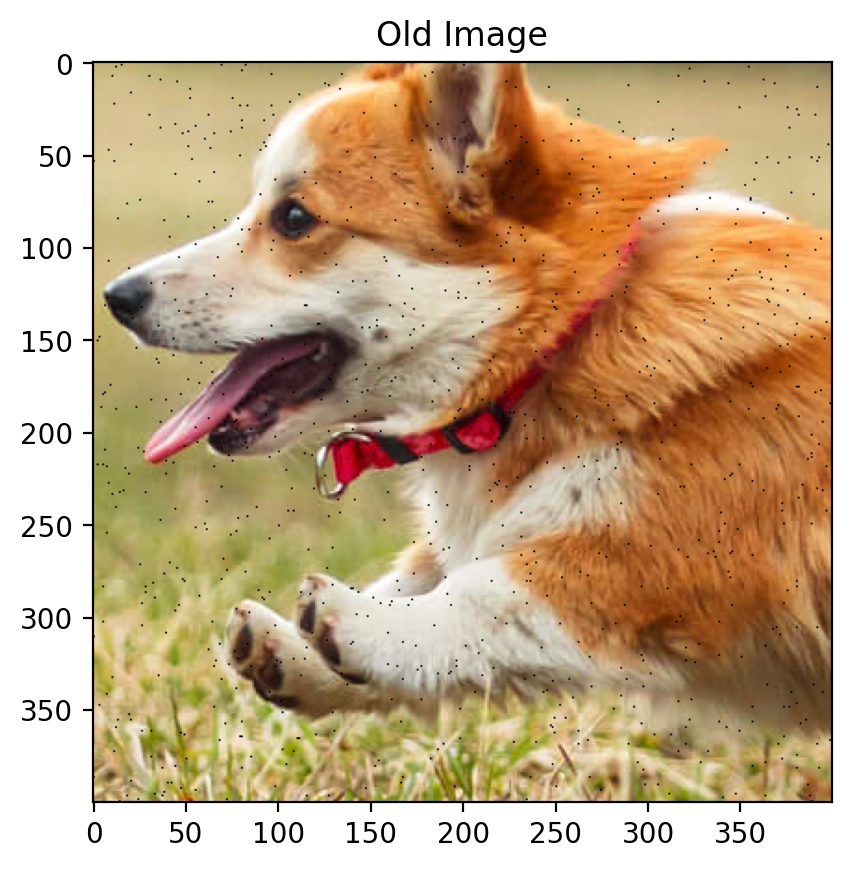

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


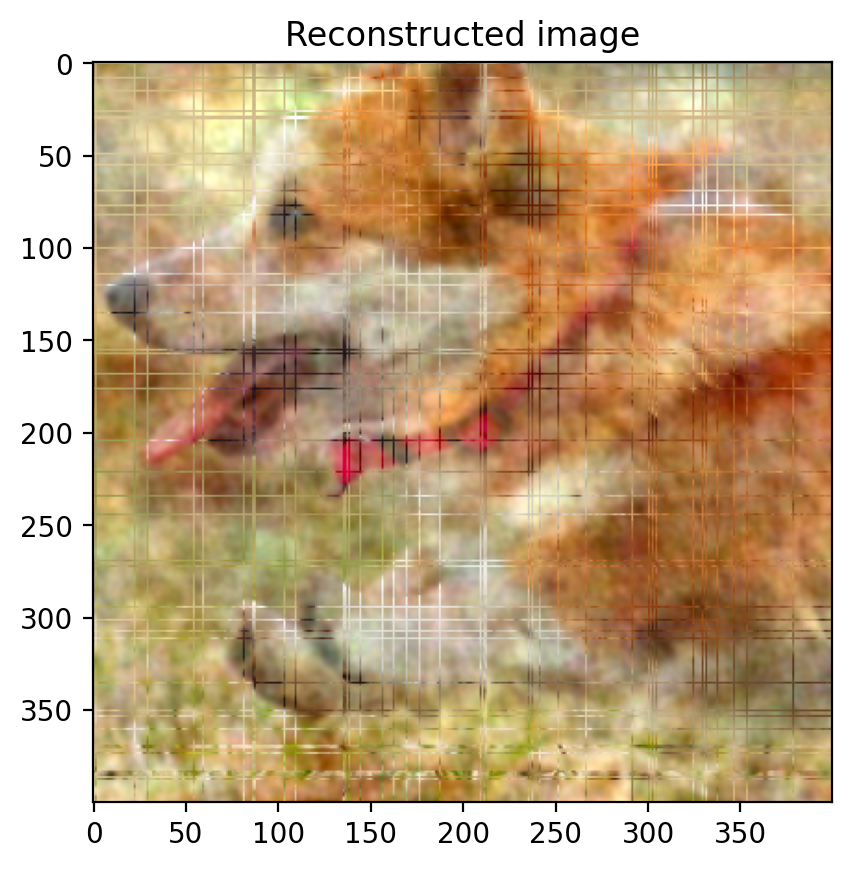

In [166]:
plt.imshow(rearrange(rend_remove_ref, 'c h w -> h w c').cpu().numpy())
plt.title("Old Image")
plt.show()

plt.imshow(rearrange(rand_remove, 'c h w -> h w c').cpu().numpy())
plt.title("Reconstructed image")
plt.show()